Webpage of the author of the article, with possibility to download its Matlab code : https://mericam.github.io/exposure_fusion/index.html 

In [ ]:
#TODO
# 1 - Implement basic pipeline (Contrast + Saturation + Well exposedness -> Masks -> Fusion)
# 2 - Improve the pipeline with Laplacian / Gaussian Pyramids
# X - Try other stuff ?

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.image as im

The main idea of exposure fusion is to directly compute a low dynamic range image with high quality from a multi-exposure image sequence, by keeping only the "best" parts of each image of this sequence. 

The "best" parts of each images are defined through weights given to each pixel, combining some quality measures : contrast, saturation and well-exposedness. To have a better result, for instance to avoid seams, a scalar-valued weight map is computed via Laplacian / Gaussian pyramids.

# Load the dataset

Description of the [dataset available on Kaggle](https://www.kaggle.com/landrykezebou/lvzhdr-tone-mapping-benchmark-dataset-tmonet) :

 "Each HDR image in the proposed LVZ-HDR Benchmark dataset is formed by fusing 5 LDR images of the same scene taken at multiple exposure brackets (-2EV, -1EV, 0EV, +1EV, +2EV). **The images are then supposed to be aligned**. The LVZ-HDR benchmark dataset consists of 456 High Dynamic Range images taken from different states, cities, time of the day and most importantly covering a wide range of sceneries. Images in the LVZ dataset are grouped into four broad scene categories: Indoors (71 images), Nature (173 images), Nighttime (80 images), and River-side-Sunset (133) images."

In [ ]:
#Download DB (can take few minutes)
%%capture
!wget http://hdr-db.u-bourgogne.fr/HDR_Database.zip
!unzip HDR_Database.zip

In [ ]:
#--- Parsing : computes db[sequences][no_image]
import os
path = 'HDR_Database/IMAGE/SCENE_3'

#Build db
db = []
for i in range(1,487):
    if (i-1)%9 == 0:
        db.append([])
    db[(i-1)//9].append(os.path.join(path,'image'+str(i)+'.tif')) 


In [ ]:
def read_images(id_,id_seq=None,filter='simple'):
    """ Loads an image or a sequence of images """
    indexs = [0,1,2,3,4,5,6,7,8]
    if filter == 'half':
        indexs = indexs[::2]
    elif filter == 'simple':
        indexs = indexs[::3]
    elif filter == 'full':
        pass
    if not(id_seq is None):
        im = plt.imread(db[id_][id_seq])/255
        return im
    else:
        l = []
        for i in indexs:
            im = read_images(id_,id_seq=i)
            l.append(im)
        l = np.array(l)
        l = np.transpose(l,(1,2,3,0)) #But N at the end
        return l

In [ ]:
def flatten_sequence(imgs):
    seq = np.transpose(imgs,(3,0,1,2))
    seq = np.reshape(seq,(-1,seq.shape[2],seq.shape[3]))
    return seq

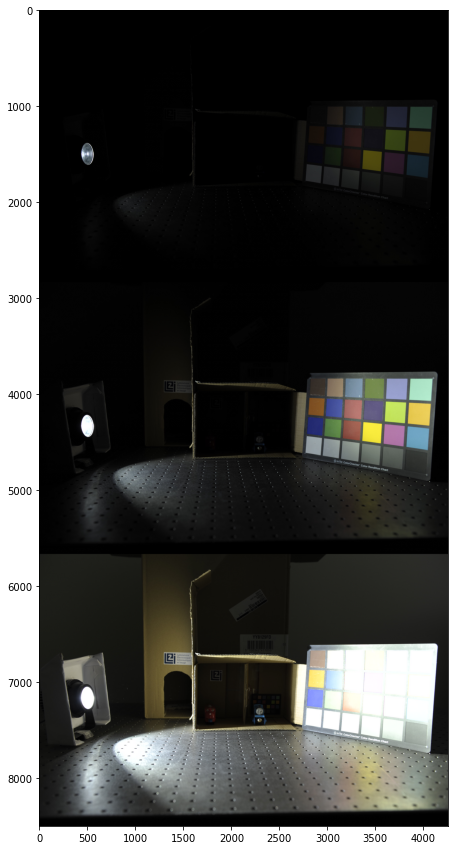

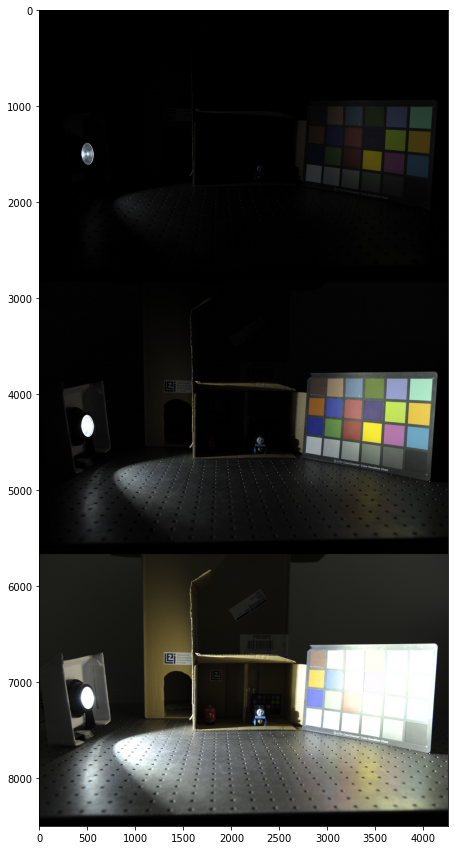

In [ ]:
images = read_images(0)
plt.figure(figsize=(15,15))
plt.imshow(flatten_sequence(images))

images = read_images(2)
plt.figure(figsize=(15,15))
plt.imshow(flatten_sequence(images))

# Step 1 - Quality measures & Weights computation

*RQ : I was wondering about the [HSL / HSV representations](https://en.wikipedia.org/wiki/HSL_and_HSV#Saturation) of an image, why not using that as quality measures ? Is there a link with the one computed here ? It's just ideas to try to make links with the course...*

In [ ]:
from skimage import color
import cv2

(2048, 2048, 3)
(2048, 2048, 3)


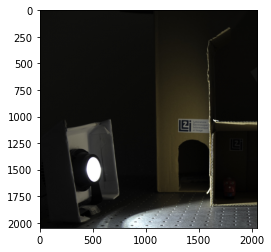

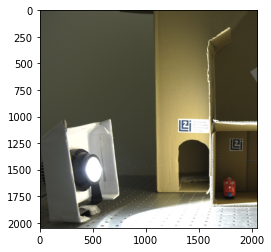

In [ ]:
# Just two random test images, as the data loading failed for now for me :  

#ld_1 = color.rgba2rgb(plt.imread('landscape_1.png'))[:750,:500,:] # shape 750 x 500 x 3
#ld_2 = color.rgba2rgb(plt.imread('landscape_2.png'))[:750,:500,:] # shape 750 x 500 x 3

ld_1 = read_images(0,5)[:2048,:2048] 
ld_2 = read_images(0,8)[:2048,:2048] 


print(ld_1.shape)
print(ld_2.shape)

plt.imshow(ld_1)
plt.show()
plt.imshow(ld_2)
plt.show()

ld = np.stack((ld_1, ld_2), axis=-1) # shape 750 x 500 x 3 x 2

## **Contrast $C$ :** 

It is computed on the gray-scale version of each image, and consists in the absolute value the response to a Laplacian filter.

  $\hookrightarrow$ should give importance to elements such as edges and textures


---
**Laplacian filter :**

I saw in the Matlab code of the article (at the end of file `exposure_fusion.m`), that the Laplacian filter used is of the form :

$$\begin{bmatrix}
0 & 1 & 0\\
1 & -4 & 1\\
0 & 1 & 0
\end{bmatrix}$$

I didn't knew about these filters before, I have found a [website a visual examples of minus this filter](https://https://www.l3harrisgeospatial.com/docs/laplacianfilters.html). It illustrates the fact that the filter is an edge detector, computing the second derivative of an image at each pixel. 

If I have well understood, it's like computing the sum of the differences between the desired pixel and the pixels of the horizontal and vertical dimension : if we are centered on the pixel $p$ in the region $\begin{bmatrix}
\_ & p_1 & \_\\
p_2 & p & p_3 \\
\_ & p_4 & \_
\end{bmatrix}$, we will compute : $C(p) = \sum_{i=1}^4 (p_i - p)$.

---

In [ ]:
def contrast (images) : 
    # images : rgb image of shape l x L x 3 or rgb images of shape l x L x 3 x N

    # gray images : 
    # ! : I didn't manage to use rgb2gray with the channel_axis arguments described
    # in the (web) skimage doc, it seems that it has been removed because it doesn't 
    # appear on the help provided executing '?color.rgb2gray' ...
    if len(images.shape) == 3 :
        gray_images = color.rgb2gray(images) # shape l x L
    else : 
        N = images.shape[-1]
        gray_images_list = []
        for n in range(N) : 
            gray_images_list.append(color.rgb2gray(images[:,:,:,n]))
        gray_images = np.stack(gray_images_list, axis=-1)  # shape l x L x N

    # application of the laplacian_filter and return the abs value of the result :
    laplacian_filter = np.array([[0,1,0], [1,-4,1], [0,1,0]])
    result = cv2.filter2D(gray_images, -1, laplacian_filter)
    return np.abs(result)

*Tests :*

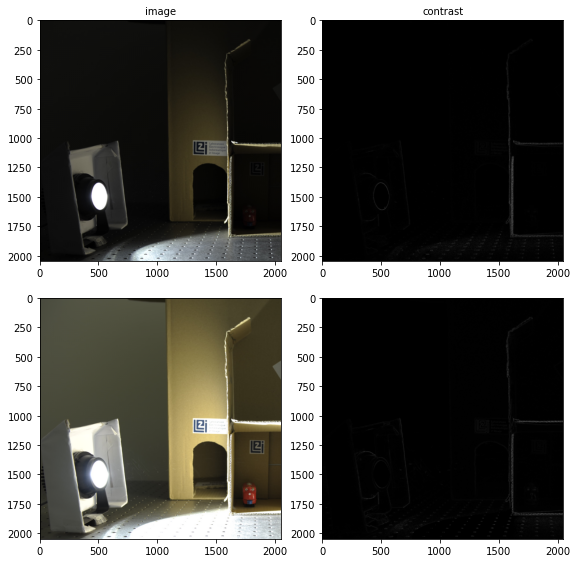

In [ ]:
fig, ax = plt.subplots(2, 2, figsize = (8,8))

for axi, col in zip(ax[0], ['image', 'contrast']) :
    axi.set_title(col, fontsize=10)
fig.tight_layout()

# Images :
ax[(0,0)].imshow(ld_1)
ax[(1,0)].imshow(ld_2)

# C : 
c = contrast(ld)
for i in range(2) : 
    ax[(i,1)].imshow(c[:,:,i], cmap='gray', vmin = 0, vmax = 1)

## **Saturation $S$ :** 

It corresponds to the standard deviation within the R, G, B channel at each pixel.

  $\hookrightarrow$ should give importance to saturated colors

In [ ]:
def saturation (images) : 
    # images : rgb image of shape l x L x 3 or rgb images of shape l x L x 3 x N
    return np.std(images,axis=2) # shape l x L ou l x L x N

*Tests : (attention : the images chosen here are not really well saturated to clearly see sth...)*

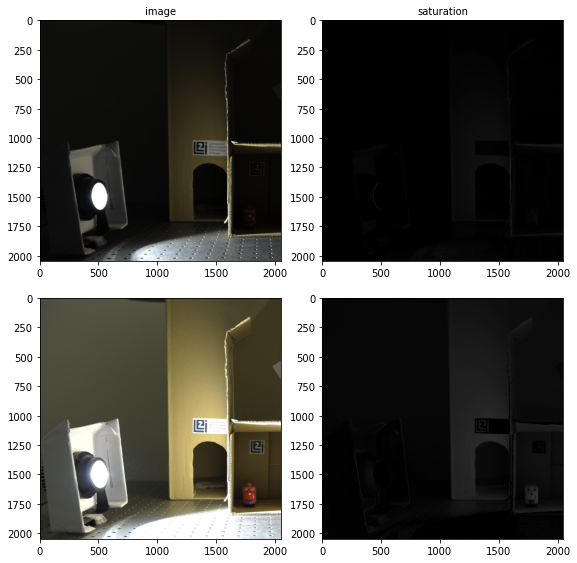

In [ ]:
fig, ax = plt.subplots(2, 2, figsize = (8,8))

for axi, col in zip(ax[0], ['image', 'saturation']) :
    axi.set_title(col, fontsize=10)
fig.tight_layout()

# Images :
ax[(0,0)].imshow(ld_1)
ax[(1,0)].imshow(ld_2)

# S : 
s = saturation(ld)
for i in range(2) : 
    ax[(i,1)].imshow(s[:,:,i], cmap='gray', vmin = 0, vmax = 1)

---

*Test 2 :* In the scikit conversion to hsv, if I have well understood the [source code](https://https://github.com/scikit-image/scikit-image/blob/main/skimage/color/colorconv.py#L228-L315), the saturation corresponds to (max-min)/max within the RGB values of each pixel. 

$\hookrightarrow$ on the test images above, I guess that it's not what we wanted, as for the really under exposed image, there are dark regions with high saturation ... I just let the test here in case we need it :) 

In [ ]:
def saturation_2 (images) : 
    # images : rgb image of shape l x L x 3 or rgb images of shape l x L x 3 x N
    return images.ptp(axis=2) / images.max(axis=2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


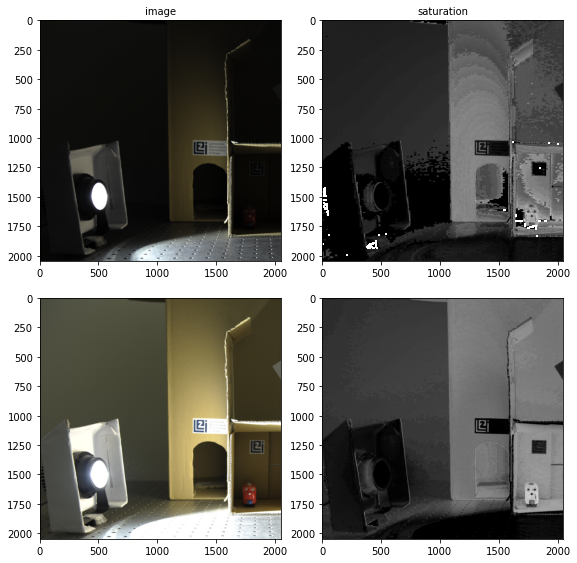

In [ ]:
fig, ax = plt.subplots(2, 2, figsize = (8,8))

for axi, col in zip(ax[0], ['image', 'saturation']) :
    axi.set_title(col, fontsize=10)
fig.tight_layout()

# Images :
ax[(0,0)].imshow(ld_1)
ax[(1,0)].imshow(ld_2)

# S : 
s = saturation_2(ld)
for i in range(2) : 
    ax[(i,1)].imshow(s[:,:,i], cmap='gray', vmin = 0, vmax = 1)

## **Well-Exposedness $E$ :** 

It corresponds to the multiplication of the exposition of each color channel independently, the exposition corresponding to how close the intensity is to 0.5. It is computed via a Gaussian curve $\propto \exp\left(- \frac{(i-0.5)^2}{2 \sigma^2} \right)$ (no need for the constant as the final weights will be re-normalized). The authors recommend to choose $\sigma = 0.2$.

  $\hookrightarrow$ should give importance to well-exposedness pixels, that is to say with an intensity that is not near 0 (under exposed) nor near 1 (over exposed).

In [ ]:
def well_exposedness (images, sigma = 0.02) :
    # images : rgb image of shape l x L x 3 or rgb images of shape l x L x 3 x N

    gaussian_curve = lambda x : np.exp(- ((x-0.5)**2) / (2* sigma**2))

    e_per_channel = gaussian_curve(images) # shape l x L x 3
    e = np.prod(e_per_channel, axis=2) # shape l x L

    return e  # shape l x L ou l x L x N

*Tests :*

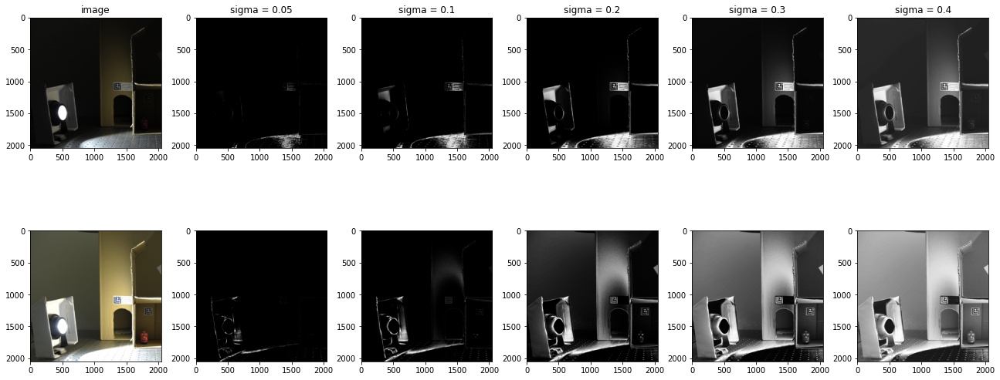

In [ ]:
sigmas = [0.05, 0.1, 0.2, 0.3, 0.4]

fig, ax = plt.subplots(2, len(sigmas)+1, figsize = (18,8))

for axi, s in zip(ax[0], ['']+sigmas) :
    if s != '' :
      axi.set_title(f'sigma = {s}', fontsize=12)
    else : 
      axi.set_title('image', fontsize=12)
fig.tight_layout()

# Images :
ax[(0,0)].imshow(ld_1)
ax[(1,0)].imshow(ld_2)

# E for different sigmas :
for k,s in enumerate(sigmas) : 
    e = well_exposedness(ld, sigma = s)
    for i in range(2) : 
        ax[(i,k+1)].imshow(e[:,:,i], cmap='gray', vmin = 0, vmax = 1)


## **Weights $W$ :** 

The weights correspond to a multiplicative combination of the three quality measures above. For pixel $(i,j)$ of image $k$, we have :
$$W_{ij,k} = \left( C_{ij,k} \right)^{\omega_C} \times \left( S_{ij,k} \right)^{\omega_S} \times \left( E_{ij,k} \right)^{\omega_E}$$
where $\omega_C, \omega_S, \omega_E$ are "weighting exponents" to choose. The fact that a multiplicative combination is chosen instead of a linear one is to "enforce all qualities", that is to say to ensure that each quality has a sufficient value. 

Note that the normalization of the weights are computed **pixel by pixel among the N different images**, that is to say that for pixel $(i,j)$ of image $k$, the normalized weight corresponds to :
$$\widehat{W}_{ij,k} = \frac{W_{ij,k}}{\sum_{k'=1}^N W_{ij,k'}}$$

In [ ]:
def weights (images, omegas = [1,1,1], sigma = 0.2, normalization = True) :
    # images : rgb image of shape l x L x 3 or rgb images of shape l x L x 3 x N
    # omages : weighting exponents, respectively corresponding to C, S and E

    C, S, E = contrast(images), saturation(images), well_exposedness(images, sigma)

    W = (C**omegas[0]) * (S**omegas[1]) * (E**omegas[2]) # shape l x L or l x L x N
    #Simple Proposition :
    if normalization and (len(W.shape)==3) : 
        W_ = W.sum(axis=2) # shape l x L 
        W_ += np.float32(W_==0.) 
        W /= W_[...,None] 

    return W  # shape l x L or l x L x N


def weights_v2 (images, omegas = [1,1,1], sigma = 0.2, normalization = True) :
    # images : rgb image of shape l x L x 3 or rgb images of shape l x L x 3 x N
    # omages : weighting exponents, respectively corresponding to C, S and E

    C, S, E = contrast(images), saturation(images), well_exposedness(images, sigma)

    W = (C**omegas[0]) * (S**omegas[1]) * (E**omegas[2]) # shape l x L or l x L x N

    if normalization and (len(W.shape)==3) : 
        W_ = W.sum(axis=2) # shape l x L 
        N = W.shape[-1]
        for n in range(N) : 
           W[:,:,n] /= W_
           
    W = np.nan_to_num(W, nan = 1/N, posinf = 1/N, neginf = 1/N)

    return W  # shape l x L or l x L x N


*Tests :*

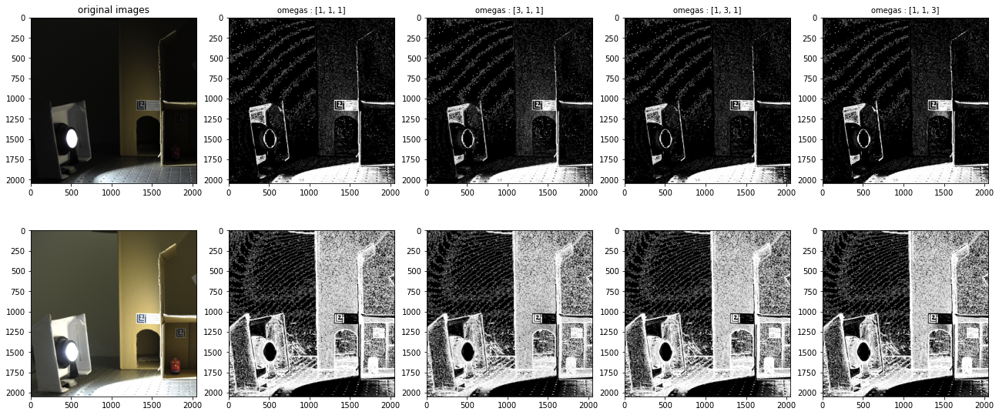

In [ ]:
# Examples with weights (v1)

omegas = [
          [1,1,1],
          [3,1,1],
          [1,3,1],
          [1,1,3]
]

fig, ax = plt.subplots(2, 5, figsize = (18,8))

for axi, o in zip(ax[0], ['']+omegas) :
    if o != '' :
        axi.set_title(f'omegas : {o}', fontsize=10)
    else : 
        axi.set_title('original images')
fig.tight_layout()

# Images :
ax[(0,0)].imshow(ld_1)
ax[(1,0)].imshow(ld_2)

# W (normalized) for different tuple omegas : 
for k,o in enumerate(omegas) : 
    w = weights(ld, omegas = o)
    for i in range(2) : 
        ax[(i,k+1)].imshow(w[:,:,i], cmap='gray', vmin = 0, vmax = 1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide


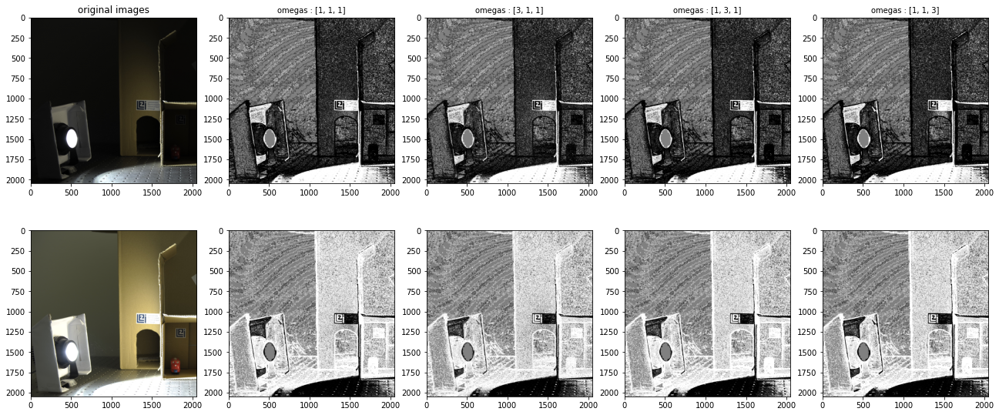

In [ ]:
# Examples with weights_v2

omegas = [
          [1,1,1],
          [3,1,1],
          [1,3,1],
          [1,1,3]
]

fig, ax = plt.subplots(2, 5, figsize = (18,8))

for axi, o in zip(ax[0], ['']+omegas) :
    if o != '' :
        axi.set_title(f'omegas : {o}', fontsize=10)
    else : 
        axi.set_title('original images')
fig.tight_layout()

# Images :
ax[(0,0)].imshow(ld_1)
ax[(1,0)].imshow(ld_2)

# W (normalized) for different tuple omegas : 
for k,o in enumerate(omegas) : 
    w = weights_v2(ld, omegas = o)
    for i in range(2) : 
        ax[(i,k+1)].imshow(w[:,:,i], cmap='gray', vmin = 0, vmax = 1)

## **Naive Fusion :** 

In [ ]:
def fusion(images, omegas=[1,1,1], sigma = 0.2):
    W = weights(images, omegas = omegas, sigma = sigma)
    fusion = np.sum(images*W[...,None,:],axis=3)
    return fusion

In [ ]:
def fusion_v2(images, omegas=[1,1,1], sigma = 0.2):
    W = weights_v2(images, omegas = omegas, sigma = sigma)
    fusion = np.sum(images*W[...,None,:],axis=3)
    return fusion

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0


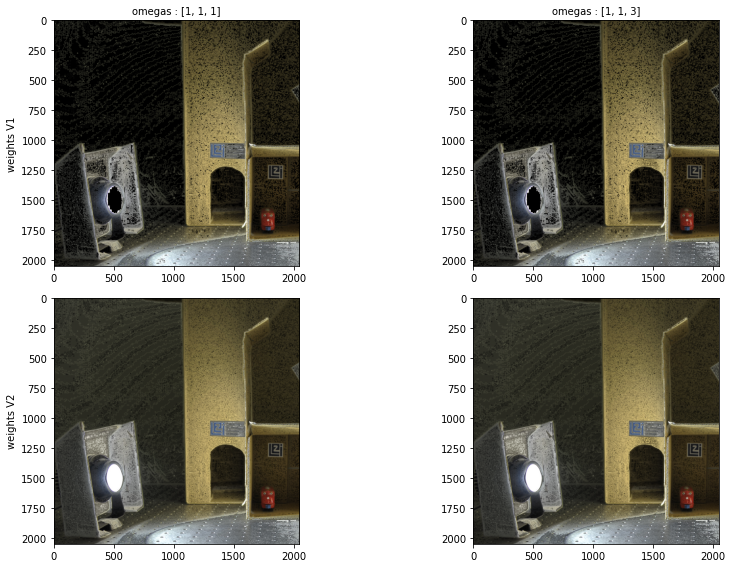

In [ ]:
fig, ax = plt.subplots(2, 2, figsize = (12,8))

omegas = [[1,1,1], [1,1,3]]
for axi, o in zip(ax[0], omegas) :
      axi.set_title(f'omegas : {o}', fontsize=10)
for axi, row in zip(ax[:,0], ['weights V1', 'weights V2']):
    axi.set_ylabel(row, rotation=90,fontsize=10)

fig.tight_layout()

for k,o in enumerate(omegas) :
    fusion_im = fusion(ld, o)
    ax[(0,k)].imshow(fusion_im)

    fusion_im_v2 = fusion_v2(ld, o)
    ax[(1,k)].imshow(fusion_im_v2)
    print( ((fusion_im-fusion_im_v2)**2).max() )

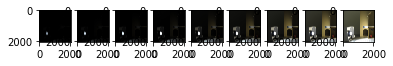

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


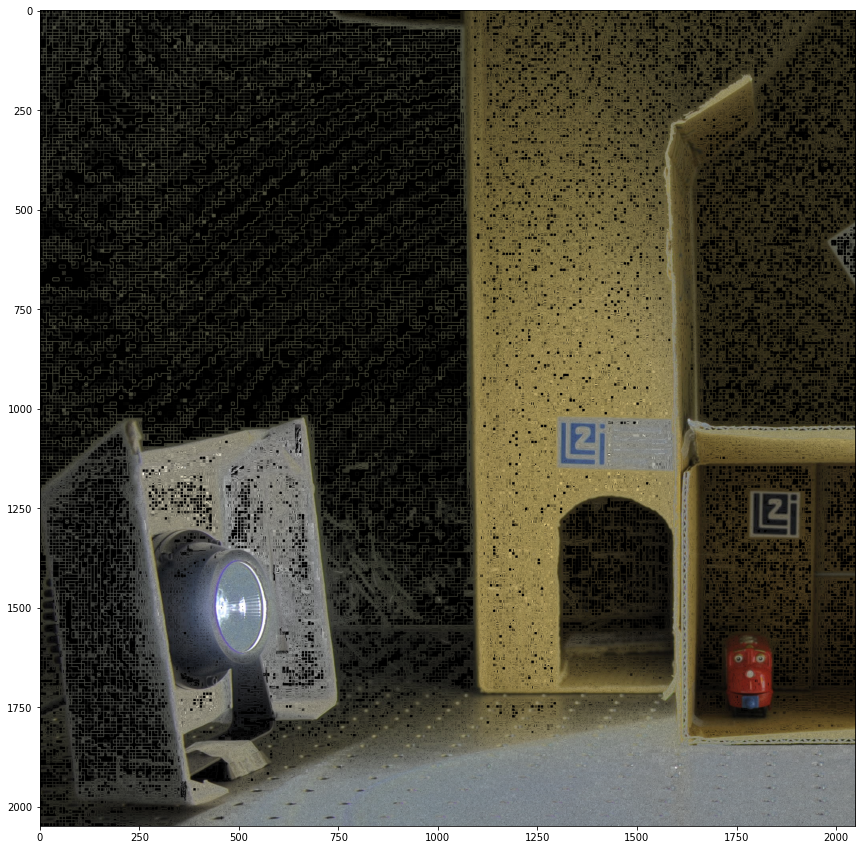

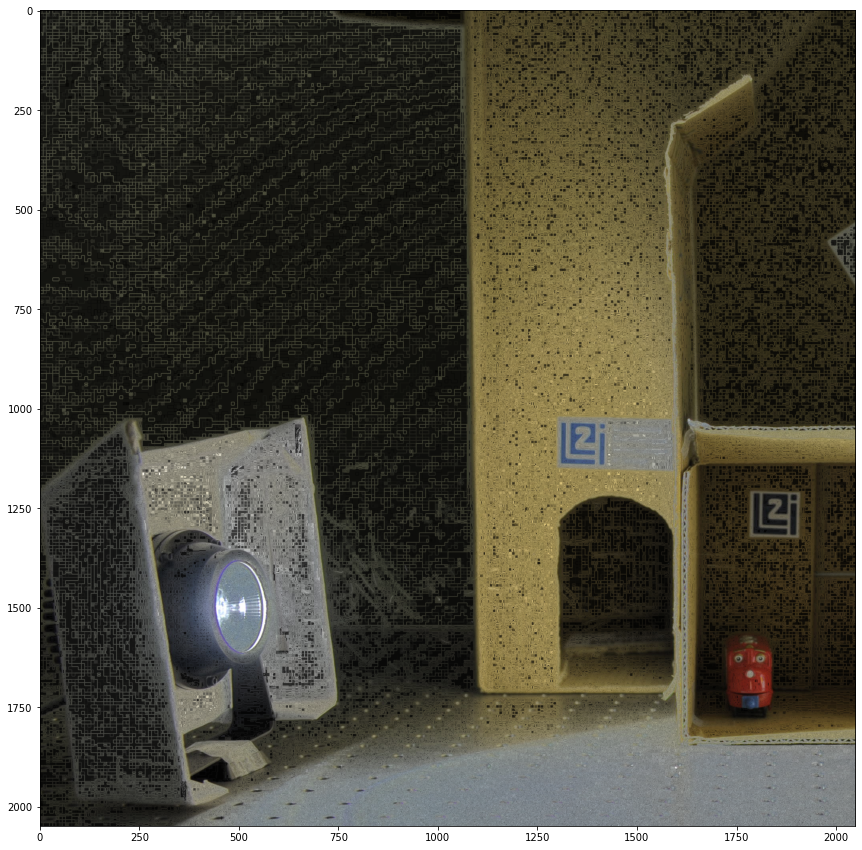

In [ ]:
#Load images
images = read_images(0,filter='full')[:2048,:2048]
for i in range(images.shape[-1]):
    im = images[...,i]
    plt.subplot(1,images.shape[-1],i+1)
    plt.imshow(im)
plt.show()

#Fusion
fusion_im = fusion(images)
#Plot
plt.figure(figsize=(15,15))
plt.imshow(fusion_im)

#Fusion v2
fusion_im_2 = fusion_v2(images)
#Plot
plt.figure(figsize=(15,15))
plt.imshow(fusion_im_2)

# Step 2 - Improvement with pyramids

To defined pyramids we need 2 operations :
* REDUCE :
    * Computes the convolution with the desired kernel (convolve)
    * Divide the size of the image by 2 (subsample)
* EXPAND :
    * Multiply the size of the image by 2 (upsample)
    * Compute the convolution with the desired kernel (convolve)

We can then define the gaussian pyramid using the gaussian kernel which needs to respect few properties :
* Separable : $K_G$ = $K_{Gh}^T.K_{Gh}$
* Symetric : $K_{Gh} = [c,b,a,b,c]$
* Coefficients : $a-2c = 2b = 1$ namely $b=\frac{1}{2}$ and $c=\frac{1-2a}{4}$

The gaussian pyramid of image $I$ is then :
$$G_0(I) = I$$
$$G_l(I) = subsample(G_K*G_{l-1}(I))$$ with $l$ the level

The laplacian pyramid is the difference between 2 stages of the gaussian :
$$L_l(I) = G_{l-1}-upsample(G_l(I))$$

*Rq : Pyramids' computation can be performed on each color channel independently*

[*Autre article qui présente les pyramides*](http://www.cns.nyu.edu/csh/csh04/Articles/Burt-Adelson-83.pdf)

## Kernel definition

In [ ]:
#See definition of pyramids here https://www.google.com/url?sa=t&rct=j&q=&esrc=s&source=web&cd=&ved=2ahUKEwjH45jPzYz1AhVLOBoKHXDhB-cQFnoECCEQAQ&url=https%3A%2F%2Fwww.cs.toronto.edu%2F~mangas%2Fteaching%2F320%2Fslides%2FCSC320L10.pdf&usg=AOvVaw00yFOfk2DqjxuBja41Ru2H

#Definition of gaussian kernel

def gaussian_kernel(a=0.3) :
  gausn_kernel_1d = np.array([[1/4-a/2,1/4,a,1/4,1/4-a/2]]) #K_Gh
  return np.dot(gausn_kernel_1d.T,gausn_kernel_1d) #K_G

gkernel = gaussian_kernel()

print("gaussian kernel : \n",gkernel,gkernel.sum())

gaussian kernel : 
 [[0.01   0.025  0.03   0.025  0.01  ]
 [0.025  0.0625 0.075  0.0625 0.025 ]
 [0.03   0.075  0.09   0.075  0.03  ]
 [0.025  0.0625 0.075  0.0625 0.025 ]
 [0.01   0.025  0.03   0.025  0.01  ]] 1.0


## Pyramid construction

In [ ]:
import torch 
from scipy.ndimage import convolve as conv
from scipy.ndimage import zoom

def convolve(im,kernel):
    return conv(im,kernel[...,None])
def downsample(im):
    return im[::2,::2]
def upsample(im):
    return zoom(im,(2,2,1))

In [ ]:
def rescale(im):
    return (im-im.min())/(im.max()-im.min())

In [ ]:
#Reduce pyramid
def pyramid(im, py_size=None, a=0.3):
    """ Returns the full pyramid from an image given a kernel (reduce direction)"""
    gkernel = gaussian_kernel(a)
    lg = [im]
    ll = []

    # Gaussian Pyramid :
    while (py_size is None and im.shape[0] >= 2 and im.shape[1] >= 2) or (not(py_size is None) and len(lg) < py_size):
        imconv = convolve(im,gkernel)
        im = downsample(imconv)
        lg.append(im)
    lg = lg[:-1] #just to suppress the last level (size 1x1)...

    # Laplacian Pyramid :
    for i in range(len(lg)-1):
        ll.append(lg[i]-upsample(lg[i+1]))
    ll.append(lg[-1]) # as there is no lg[len(ng)+1], the last image is just lg[-1]
    return lg, ll

## Collapse

From a pyramid we want to be able to recover the initial image.

* For gaussian pyramids its just the initial image

* For Laplacian pyramids it's the sum of all levels (sum & upsample when needed)

In [ ]:
def collapse(py): #Collapse Laplacian
    im = py[-1].copy()
    for i in range(len(py)-2,-1,-1):
        im = upsample(im)
        im += py[i]
    return im

### Tests

In [ ]:
#Download lenna (everyone use this image so it will be easier to compare results)
%%capture
!wget https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png
!mv "Lenna_(test_image).png" lena.png

In [ ]:
lena = plt.imread('lena.png')

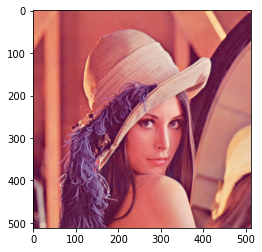

In [ ]:
plt.imshow(lena)

In [ ]:
#Compute gaussian and laplacian pyramids
pg,pl = pyramid(lena)

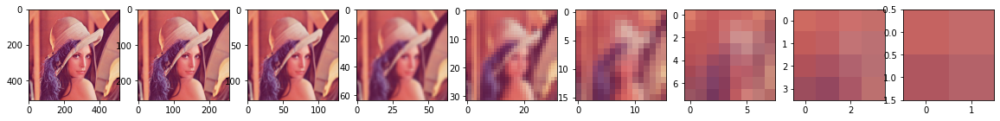

In [ ]:
#Show gaussian pyramid (not sure results are correct but it seems right)
plt.figure(figsize=(20,20))
for i,im in enumerate(pg):
    plt.subplot(1,len(pg),i+1)
    plt.imshow(im)
plt.show()

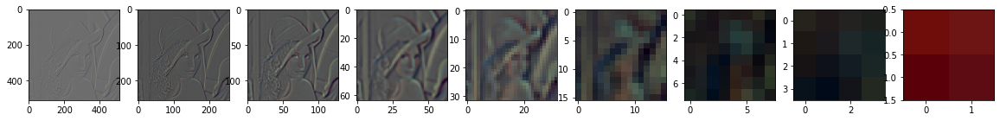

In [ ]:
#Show laplacian pyramid (not sure about the results)
plt.figure(figsize=(20,20))
for i,im in enumerate(pl):
    plt.subplot(1,len(pl),i+1)
    plt.imshow(im-im.min()) #several pixels have negative values
plt.show()

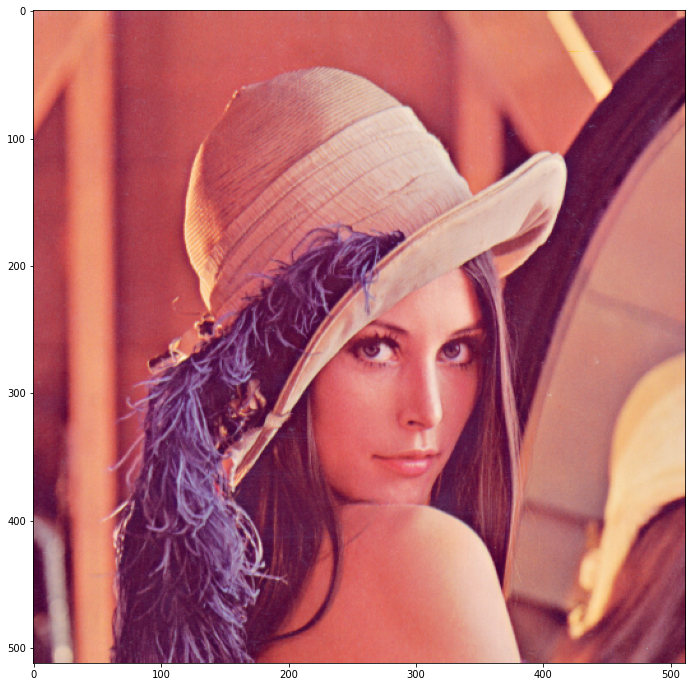

In [ ]:
#Test collapse
im = collapse(pl)
plt.figure(figsize=(12,12))
plt.imshow(im) #-im.min())

## Fusion with pyramids
To make the fusion we need to compute the gaussian pyramids of the weights and the laplacian pyramid of the images and to mix them into one final pyramid *(cf. figure 3 article)*, using the formula :
$$ L_l(F) = \sum_{0\le k\le N} G_l(W_k)L_l(I_k) $$ with $l$ the level, $I_k$ the k-th image in the input, $W_k$ the weights associated to this image and $F$ the final image.

Once we get the final pyramid we collapse it to get the fusion image $F$.


In [ ]:
#Compute fusion
def get_final_pyramid(imgs,sigma=0.2,omegas=[1,1,1],py_size=5, a=0.3):
    W = weights(imgs,sigma=sigma,omegas=omegas)
    GW = []
    LI = []
    for n in range(W.shape[-1]):
        GWn,_ = pyramid(W[...,None,n],py_size=py_size, a=a)
        _,LIn = pyramid(imgs[...,n],py_size=py_size, a=a)
        GW.append(GWn)
        LI.append(LIn)
    #Construct one pyramid of all the N pyramids
    final_pyramid = []
    for k in range(len(GW[0])): #Sum over the levels of the pyramid
        i = 0
        for n in range(len(GW)): #Sum over the N images
            i += GW[n][k]*LI[n][k]
        final_pyramid.append(i)
    return final_pyramid

In [ ]:
def pfusion(imgs,sigma=0.2,omegas=[1,1,1],py_size=5, a=0.3):
    fp = get_final_pyramid(imgs,sigma=sigma,omegas=omegas,py_size=py_size, a=a)
    return collapse(fp)

### Tests

In [ ]:
images =read_images(0,filter='full')[:2048,:2048]

In [ ]:
images.shape

(2048, 2048, 3, 9)

In [ ]:
#Compute final pyramid
fp = get_final_pyramid(images,py_size=None)

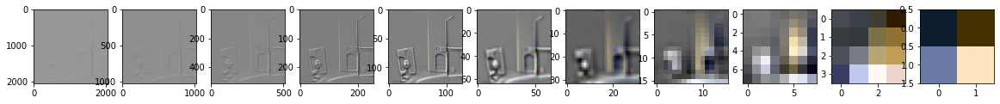

In [ ]:
#Plot final pyramid
plt.figure(figsize=(20,20))
for i,im in enumerate(fp):
    plt.subplot(1,len(fp),i+1)
    plt.imshow(rescale(im))

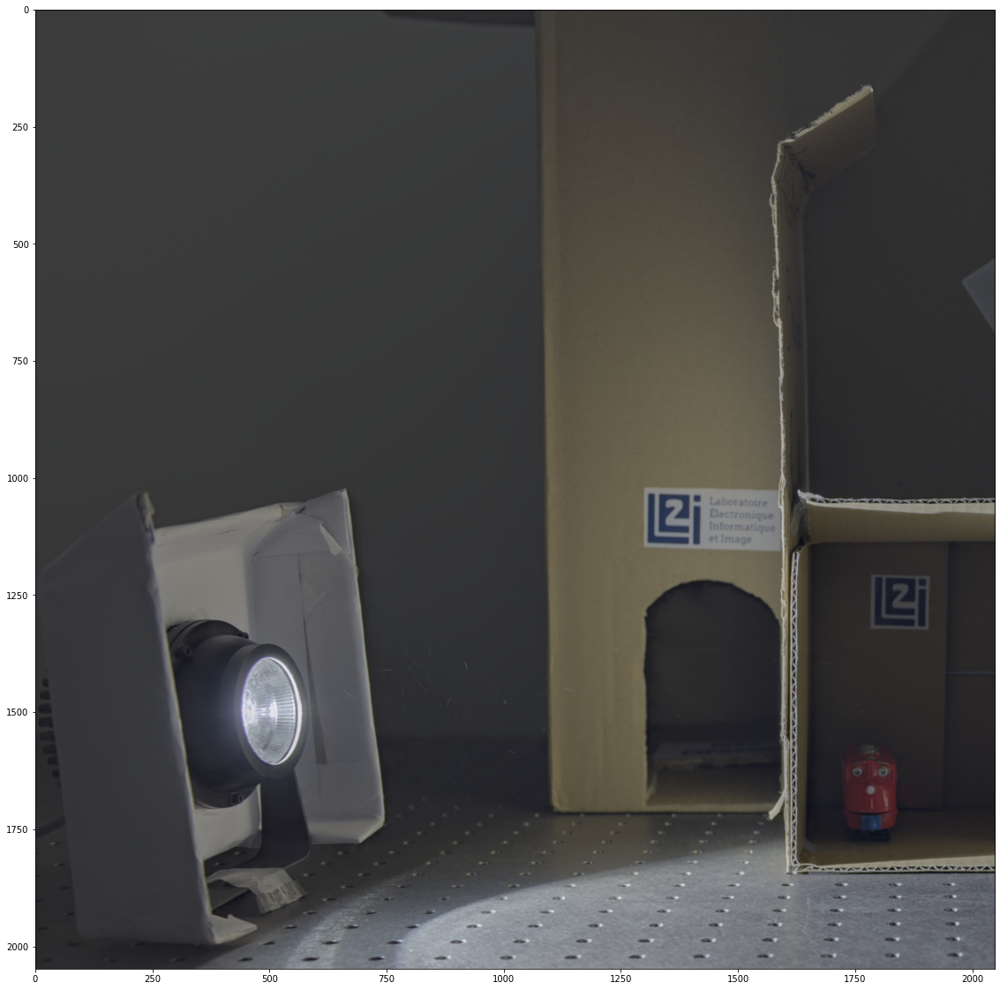

In [ ]:
#Collapse final pyramid
fusion_image = collapse(fp)
fusion_image = rescale(fusion_image)
plt.figure(figsize=(20,20))
plt.imshow(fusion_image)

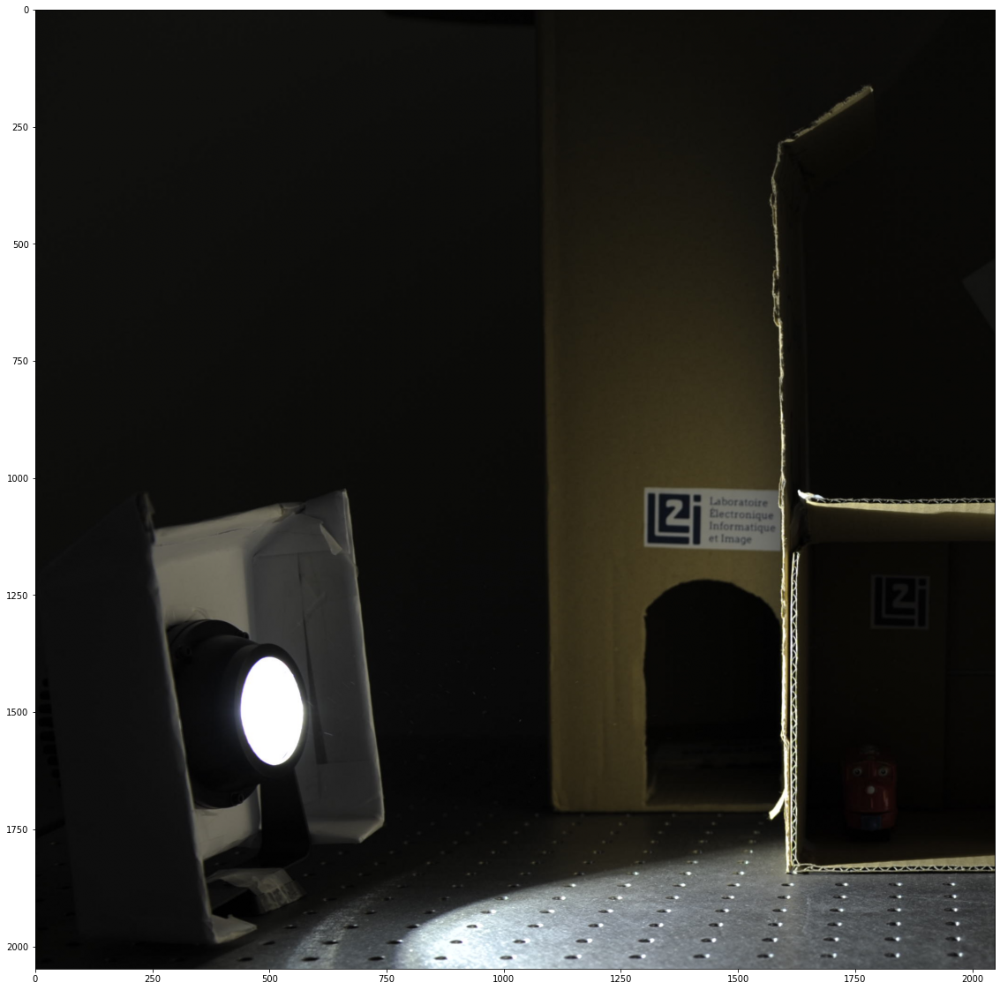

In [ ]:
#Plot original image
plt.figure(figsize=(20,20))
plt.imshow(images[...,5])

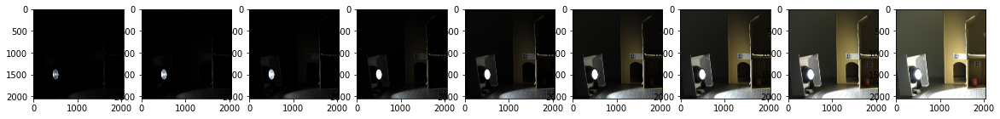

In [ ]:
#Plot original image sequence
plt.figure(figsize=(20,20))
for i in range(images.shape[-1]):
    plt.subplot(1,images.shape[-1],i+1)
    plt.imshow(images[...,i])

## Parameters search

In [ ]:
from tqdm import tqdm

100%|██████████| 5/5 [1:03:42<00:00, 764.48s/it]


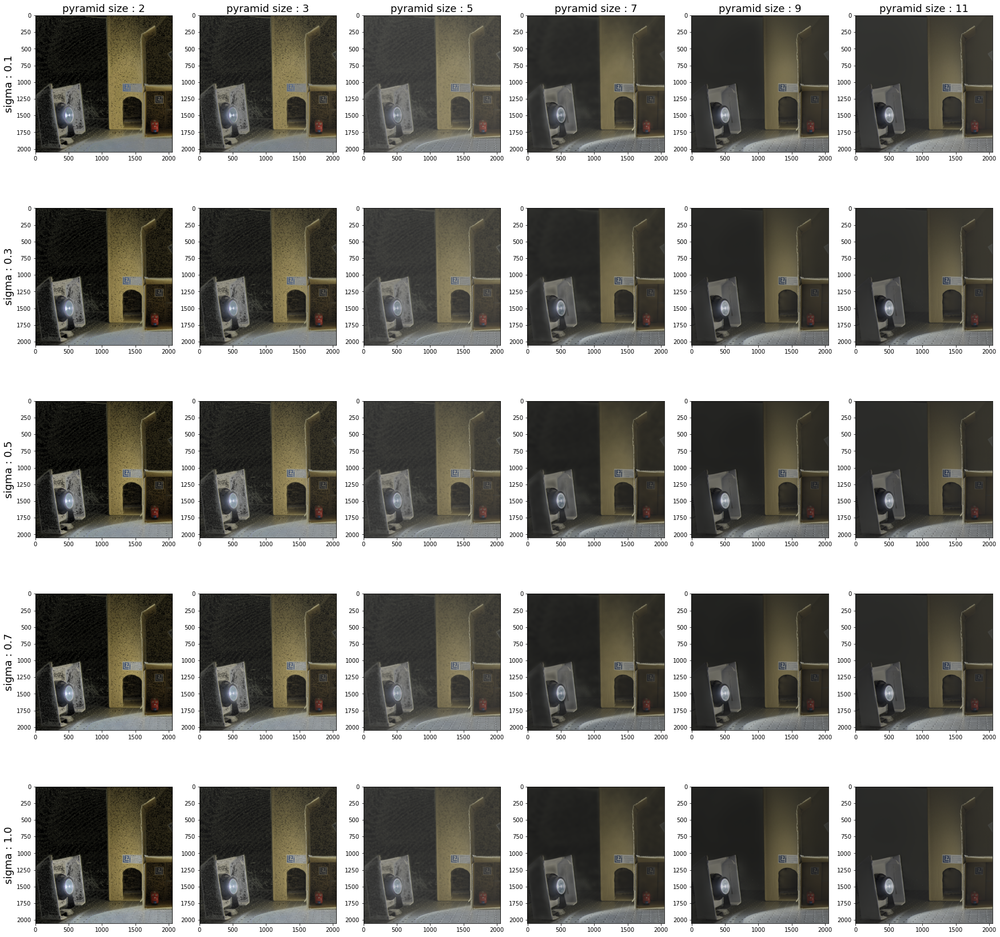

In [ ]:
images = read_images(0,filter='full')[:2048,:2048]

sigmas = [0.1,0.3,0.5,0.7,1.0]
omegas = [1,1,1]
py_sizes = [2,3,5,7,9,11]

fig, ax = plt.subplots(len(sigmas), len(py_sizes), figsize = (30,30))

# for i in range(len(py_sizes)):
#     plt.setp(ax[-1, i], xlabel='pyramid size : '+str(py_sizes[i]))
# for j in range(len(sigmas)):
#     plt.setp(ax[j, 0], ylabel='sigma : '+str(sigmas[j]))

for axi, p in zip(ax[0], py_sizes) :
    axi.set_title(f'pyramid size : {p}', fontsize=18)
for axi, s in zip(ax[:,0], sigmas):
    axi.set_ylabel(f'sigma : {s}', rotation=90,fontsize=18)


for i in tqdm(range(len(sigmas))): 
    sigma = sigmas[i]
    for j,py_size in enumerate(py_sizes):
        im_f = pfusion(images,sigma=sigma,py_size=py_size,omegas=omegas, a=0.3)
        ax[(i,j)].imshow(rescale(im_f))
plt.show()

*Essai avec un $a$ plus grand pour le noyau gaussien des pyramides (j'ai vu dans les slides que tu as citées que $a$ peut être entre $0.3$ et $0.6$ :*

100%|██████████| 5/5 [1:02:02<00:00, 744.40s/it]


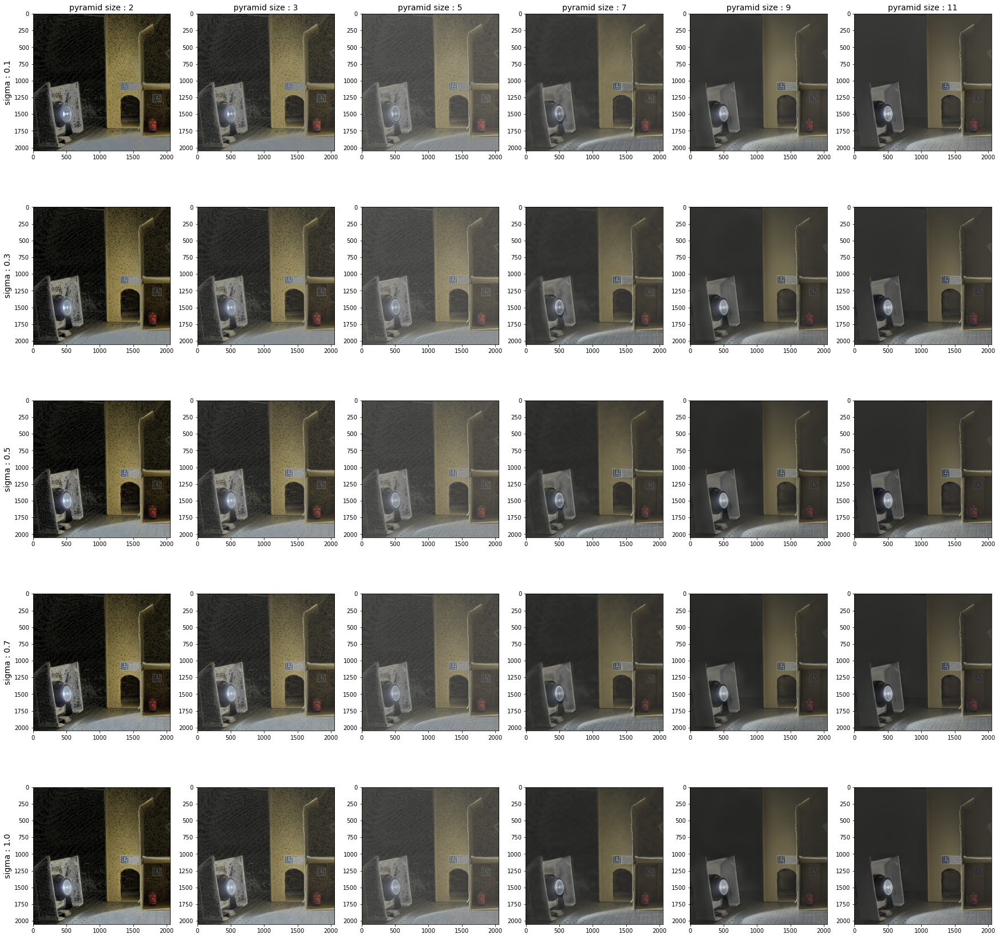

In [ ]:
a = 0.5

fig, ax = plt.subplots(len(sigmas), len(py_sizes), figsize = (30,30))

for axi, p in zip(ax[0], py_sizes) :
    axi.set_title(f'pyramid size : {p}', fontsize=14)
for axi, s in zip(ax[:,0], sigmas):
    axi.set_ylabel(f'sigma : {s}', rotation=90,fontsize=14)


for i in tqdm(range(len(sigmas))): 
    sigma = sigmas[i]
    for j,py_size in enumerate(py_sizes):
        im_f = pfusion(images,sigma=sigma,py_size=py_size,omegas=omegas, a=a)
        ax[(i,j)].imshow(rescale(im_f))

plt.show()